# Face Recognition

In [1]:
import face_recognition as fr
import cv2
import numpy as np
import cuia

## Localizar caras en una imagen

**face_locations** devuelve un vector con las localizaciones de las caras detectadas. Para cada cara indica los píxeles [Superior, Derecho, Inferior, Izquierdo] 

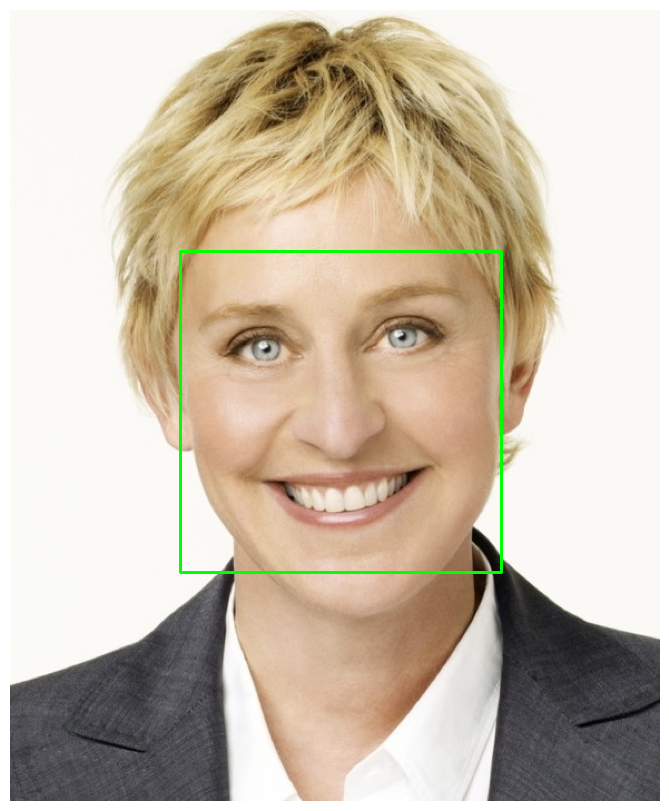

In [2]:
ellen = cv2.imread("media/ellen.jpg")
ellen_rgb = cv2.cvtColor(ellen, cv2.COLOR_BGR2RGB)
caras_ellen = fr.face_locations(ellen_rgb)
# Voy a trazar un rectángulo alrededor de las caras localizadas
copia = ellen.copy()
c = caras_ellen[0]
cv2.rectangle(copia, (c[1],c[0]), (c[3],c[2]), (0,255,0), 2, cv2.LINE_4, 0)
cuia.plot(copia)

## Obtener vector característico de una cara

**face_encodings** recibe una imagen (opcionalmente le podemos pasar las localizaciones de las caras obtenidas con face_locations) y devuelve un vector con las codificaciones de cada una de las caras encontradas.

In [3]:
cod_ellen = fr.face_encodings(ellen_rgb, caras_ellen)[0]
print(cod_ellen)

[-0.10072064  0.08700527  0.11163852 -0.0863422  -0.14097171  0.04672378
  0.04921627 -0.18601289  0.23625726 -0.15831126  0.13930292  0.0015595
 -0.20952445  0.1092109   0.00465971  0.16971835 -0.05664861 -0.2233379
 -0.15812293 -0.14661421 -0.059205    0.01048981 -0.00551234  0.05553478
 -0.12733369 -0.18465813 -0.07948378 -0.10620417  0.07255402 -0.04033257
  0.00390057  0.10527829 -0.16330977 -0.00466479  0.03003031  0.05217266
 -0.08185964 -0.15201797  0.31195641 -0.03602423 -0.14753185 -0.00857951
  0.10909504  0.12608525  0.14534262 -0.02371325  0.10358404 -0.1763835
  0.17077553 -0.24410543 -0.01293226  0.11446372  0.09471639  0.14346239
  0.08268699 -0.25863081  0.04329344  0.06820147 -0.16798316  0.15877324
  0.02412445 -0.08965278 -0.08371659 -0.07125839  0.2927056   0.15022114
 -0.08734584 -0.19275427  0.2920388  -0.12975828 -0.10589232  0.14723668
 -0.133991   -0.12851115 -0.19064188  0.01517072  0.44167897  0.10760707
 -0.19053279  0.00927906 -0.10164323 -0.05817671 -0.02

**face_encodings** puede obtener la codificación de todas las caras de una imagen

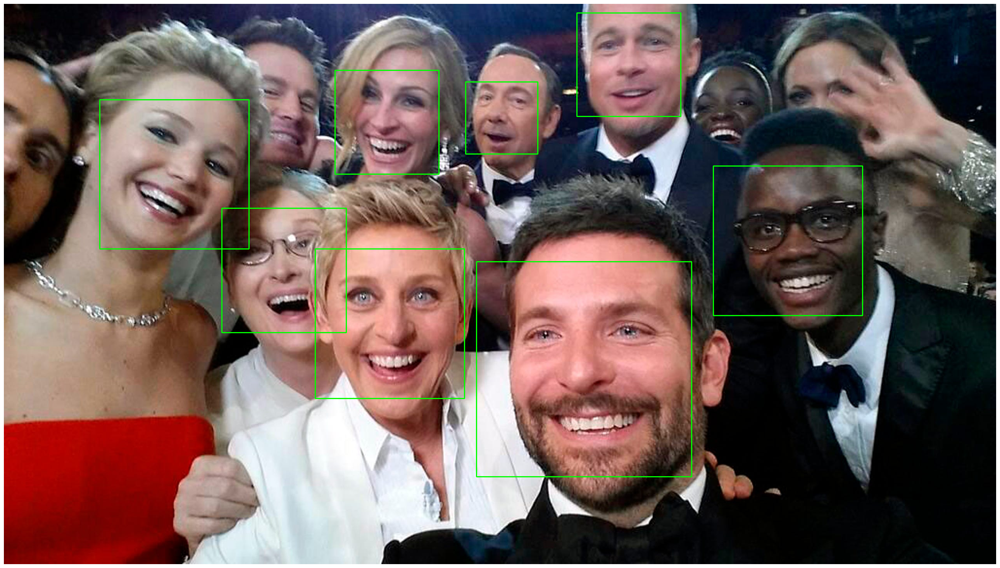

In [4]:
oscars = cv2.imread("media/oscars.jpg")
oscars_rgb = cv2.cvtColor(oscars, cv2.COLOR_BGR2RGB)
caras_oscars = fr.face_locations(oscars_rgb)
copia = oscars.copy()
for c in caras_oscars:
    cv2.rectangle(copia, (c[1],c[0]), (c[3],c[2]), (0,255,0), 2, cv2.LINE_4, 0)
cuia.plot(copia)

cod_oscars = fr.face_encodings(oscars_rgb, caras_oscars)

## Encontrar una cara dentro de un vector

**compare_faces** busca en un vector de codificaciones de caras conocidas aquellas que corresponfan a la misma persona cuya codificación indicamos. Opcionalmente podemos indicar un factor de tolerancia que por defecto es 0.6 de modo que el resultado es un vector de valores lógicos que indica **True** para las posiciones en el vector de caras conocidas que corresponden a la codificación de la cara buscada.

In [5]:
resultado = fr.compare_faces(cod_oscars, cod_ellen)
print(resultado)

[False, False, True, False, False, False, False, False]


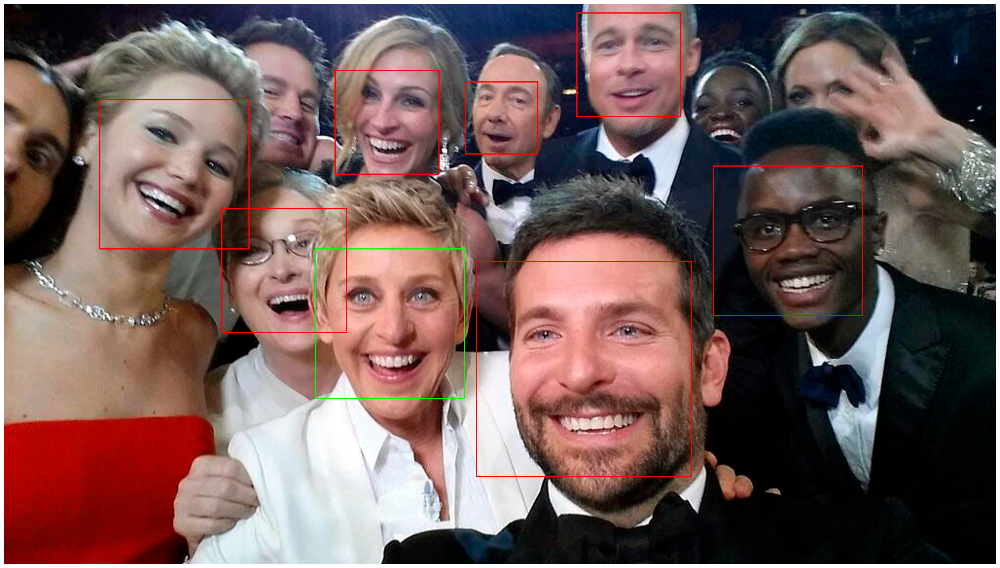

In [6]:
copia = oscars.copy()
for i in range(len(caras_oscars)):
    c = caras_oscars[i]
    if resultado[i]:
        color = (0, 255, 0)
    else:
        color = (0, 0, 255)
    cv2.rectangle(copia, (c[1],c[0]), (c[3],c[2]), color, 2, cv2.LINE_4, 0)
cuia.plot(copia)

## Identificar una cara desconocida mediante el vector de caras conocidas

Podemos tener un diccionario que guarde el nombre y codificación de la cara de una persona

In [7]:
conocidos = []
conocidos.append({ "nombre": "Ellen", "cod": cod_ellen})

Agregamos otra cara conocida al diccionario

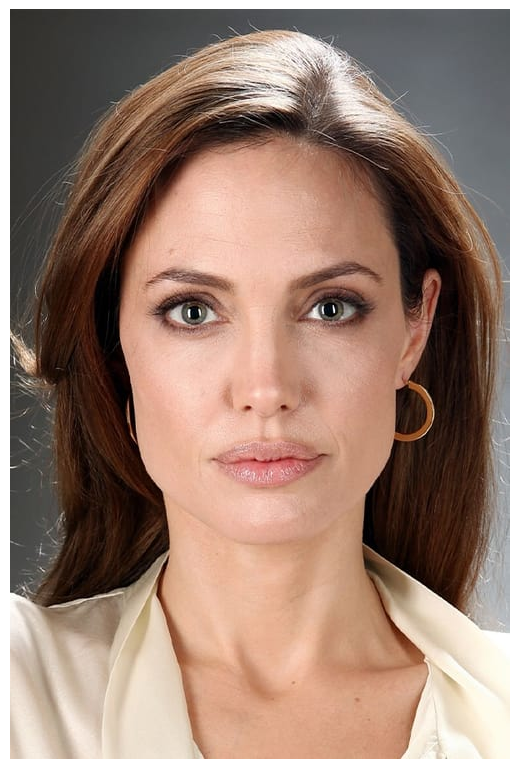

In [8]:
angelina = cv2.imread("media/angelina.jpg")
angelina_rgb = cv2.cvtColor(angelina, cv2.COLOR_BGR2RGB)
cod_angelina = fr.face_encodings(angelina_rgb)[0]
conocidos.append({ "nombre": "Angelina Jolie", "cod": cod_angelina})
cuia.plot(angelina)

Comprobemos si podemoos reconocer la cara de una desconocida

La desconocida se llama  Ellen


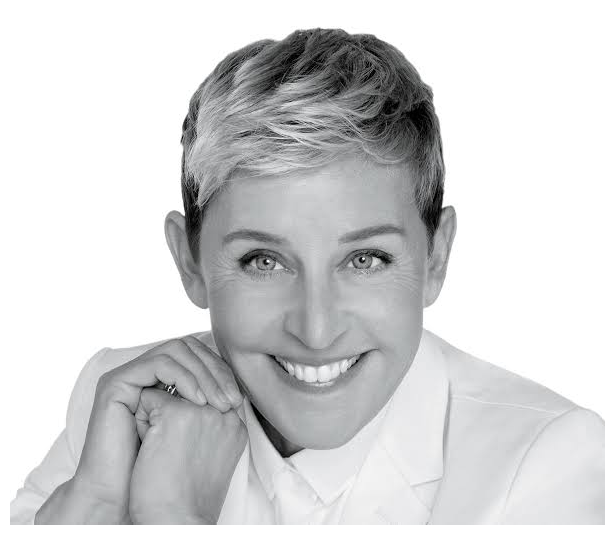

In [9]:
desconocida = cv2.imread("media/ellen2.jpg")
cuia.plot(desconocida)
desconocida_rgb = cv2.cvtColor(desconocida, cv2.COLOR_BGR2RGB)
cod_desconocida = fr.face_encodings(desconocida_rgb)[0]

# De los diccionarios de conocidos nos quedammos con las codificaciones de las caras
cod_conocidos = [ c['cod'] for c in conocidos ]

resultado = fr.compare_faces(cod_conocidos, cod_desconocida)
for i in range(len(resultado)):
    if resultado[i]:
        print("La desconocida se llama ", conocidos[i]["nombre"])

La desconocida se llama  Angelina Jolie


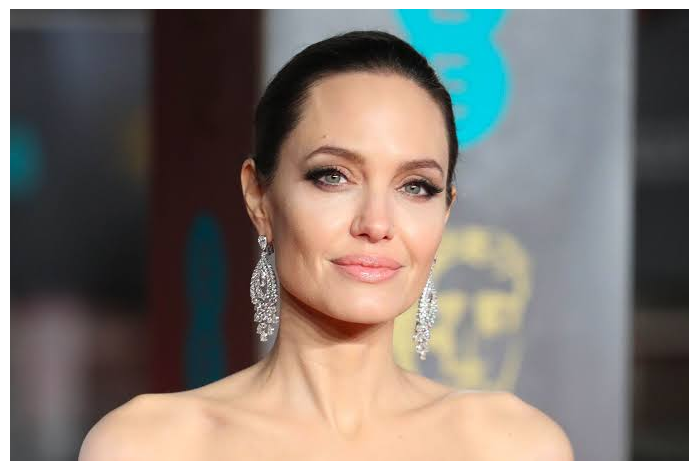

In [10]:
desconocida2 = cv2.imread("media/angelina2.jpg")
cuia.plot(desconocida2)
desconocida2_rgb = cv2.cvtColor(desconocida2, cv2.COLOR_BGR2RGB)
cod_desconocida2 = fr.face_encodings(desconocida2_rgb)[0]

resultado = fr.compare_faces(cod_conocidos, cod_desconocida2)
for i in range(len(resultado)):
    if resultado[i]:
        print("La desconocida se llama ", conocidos[i]["nombre"])